In [1]:
%matplotlib widget


## Elevation map download

I used the National Map to download GEO-tiff files for 1-meter resolution elevation maps (https://apps.nationalmap.gov/datasets/). Charlotteville uses the maps at x71-72 and y421-422.

In [2]:
import rasterio
from rasterio.plot import show
import matplotlib.pyplot as plt
import numpy as np

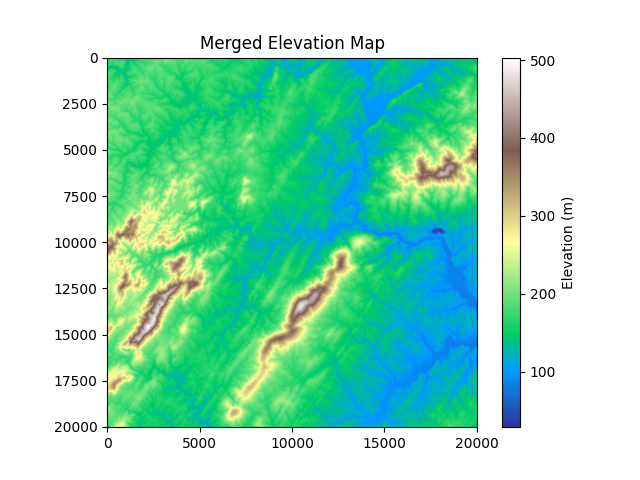

In [3]:
import rasterio
from rasterio.merge import merge
import glob
import numpy as np

# Load your DEMs
dem_files = sorted(glob.glob("data/*.tif"))
srcs = [rasterio.open(f) for f in dem_files]

# Use a consistent nodata value (e.g. -999999.0 or whatever your files use most)
# You could also scan and pick the most common one
standard_nodata = -999999.0

# Merge and apply nodata
mosaic, out_transform = merge(srcs, nodata=standard_nodata)

# Update metadata from the first file
out_meta = srcs[0].meta.copy()
out_meta.update({
    "height": mosaic.shape[1],
    "width": mosaic.shape[2],
    "transform": out_transform,
    "nodata": standard_nodata
})

# Save the result
with rasterio.open("merged_dem.tif", "w", **out_meta) as dest:
    dest.write(mosaic)

# Optional: Visual check
import matplotlib.pyplot as plt
plt.imshow(mosaic[0], cmap='terrain')
plt.colorbar(label="Elevation (m)")
plt.title("Merged Elevation Map")
plt.show()



## City boundary map
Download city boundaries ([download](https://opendata.charlottesville.org/datasets/43253262b4da436bbac25d8cdb2f043b_44/explore?location=38.040076%2C-78.485050%2C13.68))

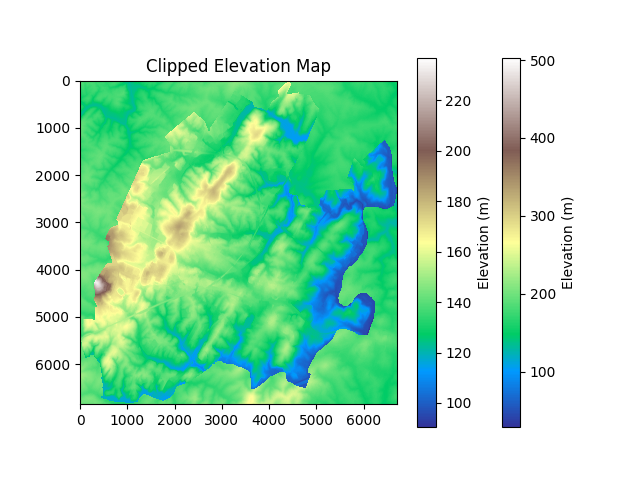

In [4]:
import geopandas as gpd
from rasterio.mask import mask
import json
from shapely.geometry import mapping


# Load city boundary as a shapefile or GeoJSON
city = gpd.read_file("data/Municipal_Boundary_Area.geojson")  # or .shp

# Reproject to match raster CRS
with rasterio.open('merged_dem.tif') as src:
    city = city.to_crs(src.crs)
    # Assuming `city` is your GeoDataFrame
    geoms = city.geometry.values
    geoms = [mapping(geom) for geom in geoms]  # Correct, way to convert for rasterio
    out_image, out_transform = mask(src, geoms, crop=True, nodata=src.nodata)
    nodata_val = src.nodata
    elevation = out_image[0]
    elevation_masked = np.ma.masked_equal(elevation, nodata_val)

    plt.imshow(elevation_masked, cmap='terrain')
    plt.title("Clipped Elevation Map")
    plt.colorbar(label='Elevation (m)')
    plt.show()


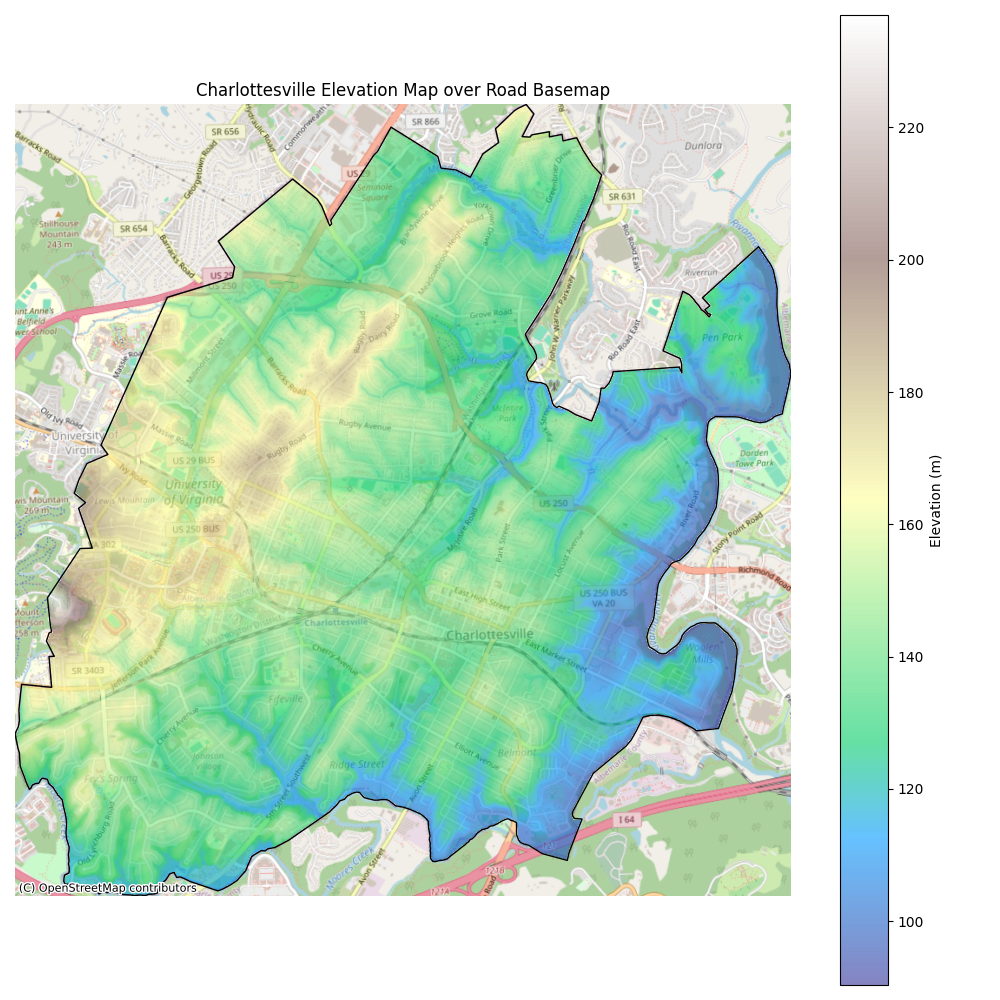

In [5]:
# 5. Convert raster bounds to a GeoDataFrame for contextily basemap overlay
from rasterio.transform import from_origin
from affine import Affine
from rasterio.plot import plotting_extent
import contextily as cx

# Get extent in raster CRS
extent = plotting_extent(out_image[0], out_transform)

# 6. Plot DEM on top of basemap
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the DEM
img = ax.imshow(
    elevation_masked,
    cmap='terrain',
    extent=extent,
    origin='upper',
    alpha=0.6,  # Transparency: 0 = invisible, 1 = opaque
    zorder=1
)
# Plot the city boundary outline for reference
city.boundary.plot(ax=ax, color='black', linewidth=1)

# Add basemap with roads
cx.add_basemap(ax, source=cx.providers.OpenStreetMap.Mapnik, crs=city.crs, zorder=0)

# Final touches
plt.colorbar(img, ax=ax, label="Elevation (m)")
ax.set_title("Charlottesville Elevation Map over Road Basemap")
plt.axis("off")
plt.tight_layout()
plt.show()

In [6]:
print("Extent:", extent)


Extent: (717355.0, 724072.0, 4209811.0, 4216660.0)


## Road slopes

In [7]:
import osmnx as ox
import geopandas as gpd

# Define area — you can use "Charlottesville, Virginia, USA"
G = ox.graph_from_place("Charlottesville, Virginia, USA", network_type='drive')
roads = ox.graph_to_gdfs(G, nodes=False, edges=True)

# Save to GeoJSON if you want
roads.to_file("charlottesville_roads.geojson", driver="GeoJSON")


In [8]:
import osmnx as ox
import geopandas as gpd
import rasterio
import numpy as np
from shapely.geometry import LineString
import matplotlib.pyplot as plt
import contextily as cx
from rasterio.transform import rowcol

# --- Parameters ---
sample_resolution = 40  # meters between elevation points

# --- Step 1: Download roads for Charlottesville ---
G = ox.graph_from_place("Charlottesville, Virginia, USA", network_type='drive')
roads = ox.graph_to_gdfs(G, nodes=False, edges=True)

# --- Step 2: Load DEM ---
with rasterio.open("merged_dem.tif") as src:
    dem = src.read(1)
    transform = src.transform
    nodata = src.nodata
    dem_crs = src.crs

# --- Step 3: Reproject roads to DEM CRS ---
roads = roads.to_crs(dem_crs)

# --- Step 4: Function to extract slope segments ---
def get_elevation(x, y):
    row, col = rowcol(transform, x, y)
    try:
        return dem[row, col]
    except IndexError:
        return np.nan

segments = []

for _, row in roads.iterrows():
    line = row.geometry
    if line.length < sample_resolution:
        continue

    distances = np.arange(0, line.length, sample_resolution)
    points = [line.interpolate(d) for d in distances]
    elevations = [get_elevation(pt.x, pt.y) for pt in points]

    for i in range(len(points) - 1):
        p1, p2 = points[i], points[i+1]
        z1, z2 = elevations[i], elevations[i+1]
        if np.isnan(z1) or np.isnan(z2):
            continue
        rise = z2 - z1
        run = sample_resolution
        grade = (rise / run) * 100  # percent grade
        seg = LineString([p1, p2])
        segments.append({"geometry": seg, "grade_percent": grade, "abs_grade_percent": abs(grade), "elevation_start": z1, "elevation_end": z2})

# --- Step 5: Create GeoDataFrame of segments ---
segments_gdf = gpd.GeoDataFrame(segments, crs=dem_crs)



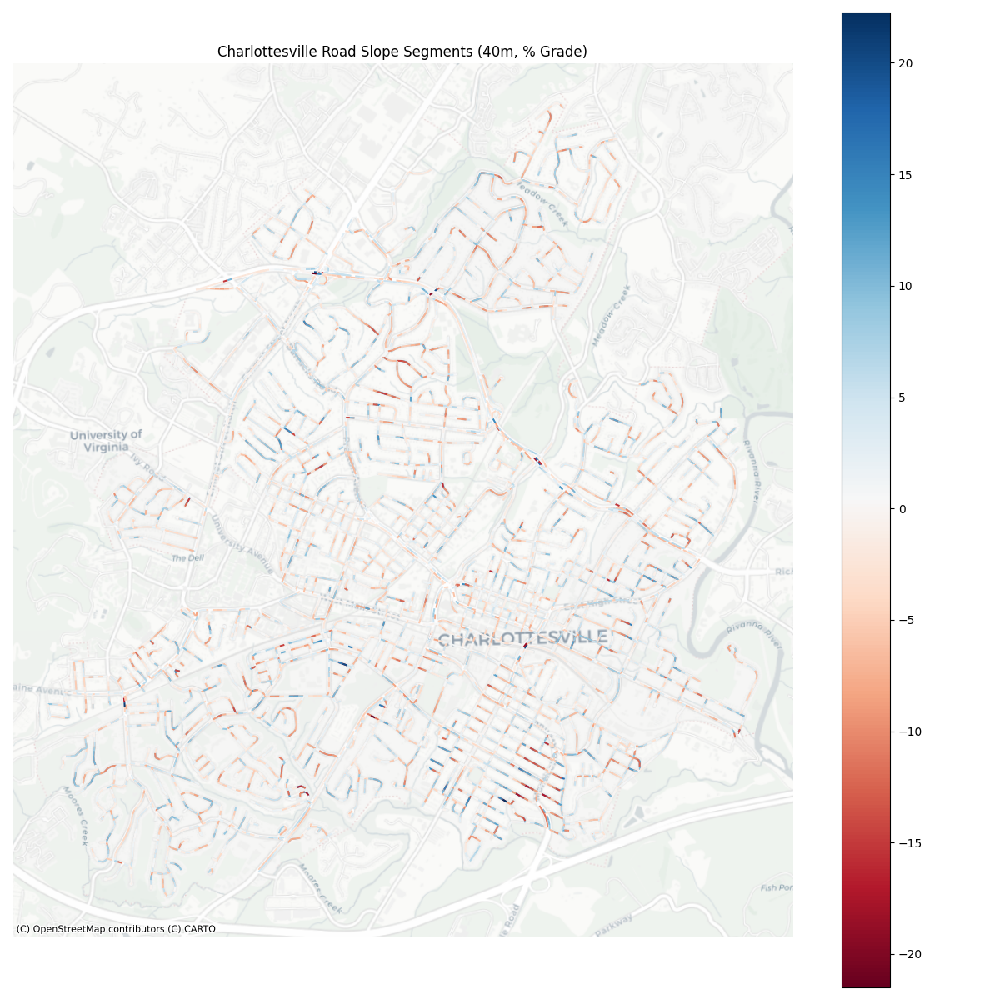

In [9]:
# --- Step 6: Plot colored slope segments over basemap ---
fig, ax = plt.subplots(figsize=(12, 12))

segments_gdf.plot(
    column="grade_percent",
    cmap="RdBu",
    linewidth=1.5,
    ax=ax,
    legend=True,
    zorder=2
)

cx.add_basemap(ax, source=cx.providers.CartoDB.Positron, crs=segments_gdf.crs, zorder=1)

plt.title(f"Charlottesville Road Slope Segments ({sample_resolution}m, % Grade)")
plt.axis("off")
plt.tight_layout()
plt.show()


/var/folders/vh/xk34gq593k53lzm7wlyg64xw0000gn/T/ipykernel_75200/4167235881.py:21: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(12, 12))


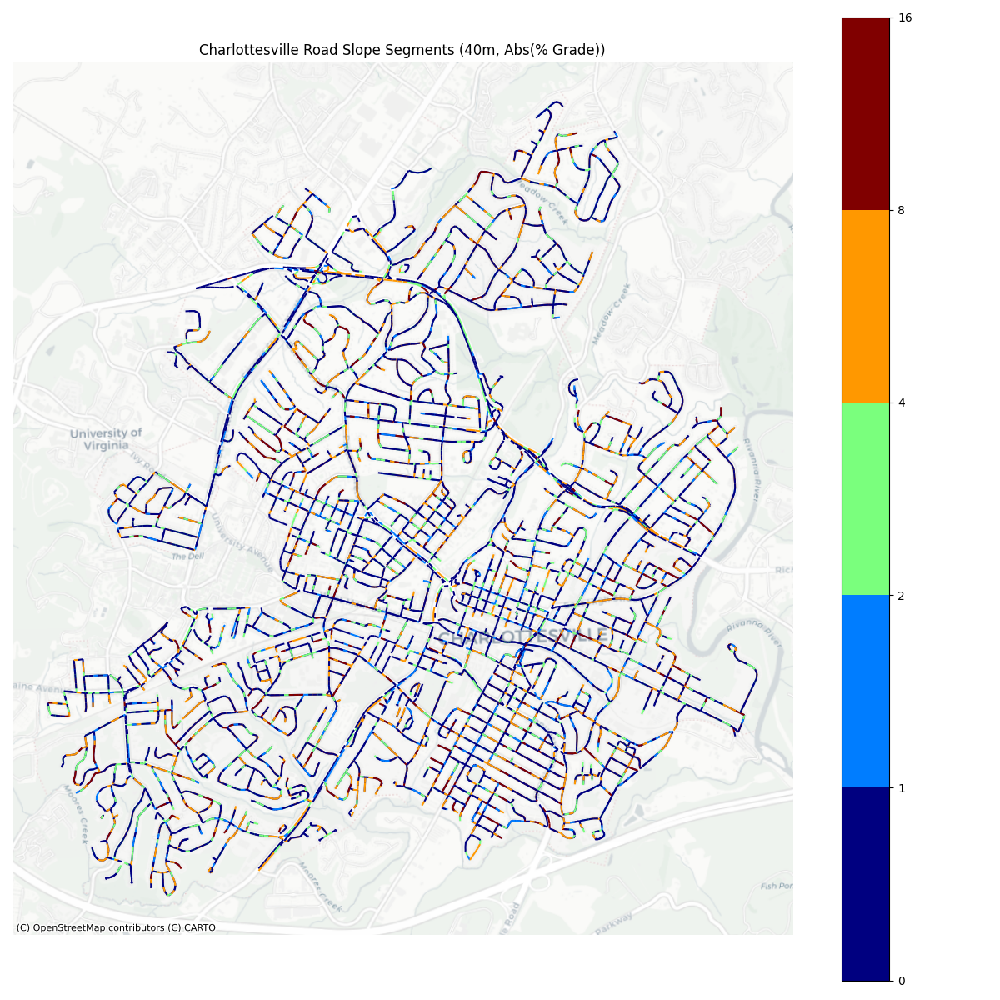

In [33]:
# --- Step 6: Plot colored slope segments over basemap ---
from matplotlib.colors import TwoSlopeNorm
from matplotlib.colors import BoundaryNorm

# Assume most of your grades fall in this range
# vmin = 0     # start of colormap (purple)
# vcenter =  5  # where blue-green transition happens
# vmax =     # end of colormap (yellow)

# norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)


# Define exact grade breaks for color transitions
boundaries = [0,1, 2, 4, 8, 16]
cmap = plt.get_cmap("jet")
norm = BoundaryNorm(boundaries, ncolors=cmap.N, clip=True)




fig, ax = plt.subplots(figsize=(12, 12))

segments_gdf.plot(
    column="grade_percent",
    cmap=cmap,
    norm=norm,
    linewidth=1.5,
    ax=ax,
    legend=True
)
cx.add_basemap(ax, source=cx.providers.CartoDB.Positron, crs=segments_gdf.crs, zorder=1)

plt.title(f"Charlottesville Road Slope Segments ({sample_resolution}m, Abs(% Grade))")
plt.axis("off")
plt.tight_layout()
plt.savefig("road_grades.pdf")

In [11]:
import osmnx as ox
import geopandas as gpd
import rasterio
import numpy as np
from shapely.geometry import LineString
import matplotlib.pyplot as plt
import contextily as cx
from rasterio.transform import rowcol
import ipywidgets as widgets
from IPython.display import display, clear_output

# --- Load data once ---
G = ox.graph_from_place("Charlottesville, Virginia, USA", network_type='drive')
roads = ox.graph_to_gdfs(G, nodes=False, edges=True)

with rasterio.open("merged_dem.tif") as src:
    dem = src.read(1)
    transform = src.transform
    dem_crs = src.crs

roads = roads.to_crs(dem_crs)

# --- Main function to calculate and plot slopes ---
def plot_slope_segments(sample_resolution):
    segments = []

    for _, row in roads.iterrows():
        line = row.geometry
        if line.length < sample_resolution:
            continue

        distances = np.arange(0, line.length, sample_resolution)
        points = [line.interpolate(d) for d in distances]

        coords = [(pt.x, pt.y) for pt in points]
        try:
            with rasterio.open("merged_dem.tif") as src:
                elevations = [val[0] for val in src.sample(coords)]
        except:
            continue

        for i in range(len(points) - 1):
            p1, p2 = points[i], points[i+1]
            z1, z2 = elevations[i], elevations[i+1]
            if np.isnan(z1) or np.isnan(z2):
                continue
            rise = z2 - z1
            run = sample_resolution
            grade = (rise / run) * 100
            seg = LineString([p1, p2])
            segments.append({"geometry": seg, "grade_percent": grade})

    # Build GeoDataFrame
    segments_gdf = gpd.GeoDataFrame(segments, crs=dem_crs)

    # Plot
    plt.clf()
    fig, ax = plt.subplots(figsize=(10, 10))
    segments_gdf.plot(
        column="grade_percent",
        cmap="plasma",
        linewidth=1.5,
        ax=ax,
        legend=True,
        zorder=2
    )
    cx.add_basemap(ax, source=cx.providers.CartoDB.Positron, crs=dem_crs, zorder=1)
    ax.set_title(f"Charlottesville Road Slopes – {sample_resolution}m Resolution")
    ax.axis("off")
    plt.tight_layout()
    plt.show()



In [12]:
from IPython.display import display
import ipywidgets as widgets

slider = widgets.IntSlider(
    value=10, min=5, max=50, step=5,
    description='Resolution (m):', continuous_update=False
)

out = widgets.interactive_output(plot_slope_segments, {"sample_resolution": slider})
display(slider, out)


IntSlider(value=10, continuous_update=False, description='Resolution (m):', max=50, min=5, step=5)

Output()

In [14]:
import ipywidgets as widgets
from IPython.display import display
import matplotlib.pyplot as plt
import contextily as cx

# --- Interactive filtering and plotting function ---
def plot_filtered_roads(max_grade):
    filtered = segments_gdf[
        (segments_gdf["abs_grade_percent"] < max_grade) &
        (segments_gdf["abs_grade_percent"].notna())
    ]
    
    plt.figure(figsize=(10, 10))
    ax = plt.gca()
    
    if filtered.empty:
        plt.title(f"No segments below {max_grade:.1f}% grade")
    else:
        filtered.plot(
            column="abs_grade_percent",
            cmap="jet",
            linewidth=1.5,
            ax=ax,
            legend=True,
            vmin=0, vmax=15  # keep colormap scale fixed
        )
        cx.add_basemap(ax, source=cx.providers.CartoDB.Positron, crs=filtered.crs)
        plt.title(f"Road Segments with Grade < {max_grade:.1f}%")

    plt.axis("off")
    plt.tight_layout()
    plt.show()

# --- Create interactive slider ---
grade_slider = widgets.FloatSlider(
    value=2.5,
    min=0,
    max=15,
    step=0.5,
    description="Max Grade (%)",
    continuous_update=False
)

# --- Link slider to function ---
widgets.interact(plot_filtered_roads, max_grade=grade_slider)


interactive(children=(FloatSlider(value=2.5, continuous_update=False, description='Max Grade (%)', max=15.0, s…

<function __main__.plot_filtered_roads(max_grade)>

In [15]:
import networkx as nx
from shapely.geometry import LineString, Point
filtered_segments = segments_gdf[
    (segments_gdf["abs_grade_percent"] <= 5) &
    (segments_gdf["abs_grade_percent"].notna())
]

G = nx.Graph()

for i, row in filtered_segments.iterrows():
    line = row.geometry
    start = (round(line.coords[0][0], 3), round(line.coords[0][1], 3))
    end = (round(line.coords[-1][0], 3), round(line.coords[-1][1], 3))
    length = line.length
    G.add_edge(start, end, weight=length, geometry=line, grade=row["abs_grade_percent"])


In [32]:
nx.draw(G)

KeyboardInterrupt: 

In [16]:
from shapely.geometry import Point
from scipy.spatial import cKDTree
import numpy as np

# Create a list of all nodes
node_coords = np.array(list(G.nodes))
tree = cKDTree(node_coords)

# User-selected start/end (in same CRS as DEM)
start_pt = Point(715000, 4210000)
end_pt = Point(719000, 4215000)

# Snap to nearest graph nodes
start_idx = tree.query([start_pt.x, start_pt.y])[1]
end_idx = tree.query([end_pt.x, end_pt.y])[1]
start_node = tuple(node_coords[start_idx])
end_node = tuple(node_coords[end_idx])


In [17]:
try:
    path = nx.shortest_path(G, start_node, end_node, weight='weight')
except nx.NetworkXNoPath:
    path = None


In [18]:
import matplotlib.pyplot as plt
import geopandas as gpd
import contextily as cx

# Build GeoDataFrame from path
if path:
    path_lines = []
    for i in range(len(path) - 1):
        data = G.get_edge_data(path[i], path[i+1])
        path_lines.append(data['geometry'])

    path_gdf = gpd.GeoDataFrame(geometry=path_lines, crs=segments_gdf.crs)

    # Plot
    ax = filtered_segments.plot(color="lightgray", linewidth=0.5, figsize=(10, 10))
    path_gdf.plot(ax=ax, color="red", linewidth=3)
    cx.add_basemap(ax, source=cx.providers.CartoDB.Positron, crs=segments_gdf.crs)
    plt.title(f"Shortest Path with Max Grade ≤ {max_grade}%")
    plt.axis("off")
    plt.tight_layout()
    plt.show()
else:
    print("⚠️ No path found within the grade constraint.")


⚠️ No path found within the grade constraint.


In [19]:
# import geopandas as gpd
# import matplotlib.pyplot as plt
# import numpy as np
# import contextily as cx
# import networkx as nx
# from shapely.geometry import LineString, Point
# from scipy.spatial import cKDTree
# import ipywidgets as widgets
# from IPython.display import display, clear_output

# # --- Load your segments with grade_percent ---
# assumes you already have `segments_gdf` built from road sampling
gdf = segments_gdf.copy()  # keep original untouched

# --- Create grade threshold slider ---
grade_slider = widgets.FloatSlider(
    value=2.5, min=0, max=15, step=0.5,
    description="Max Grade (%)",
    continuous_update=False
)



FloatSlider(value=2.5, continuous_update=False, description='Max Grade (%)', max=15.0, step=0.5)

In [20]:
def snap_to_graph_node(point, node_tree, node_array):
    idx = node_tree.query([point.x, point.y])[1]
    return tuple(node_array[idx])


FloatSlider(value=5.500000000000001, continuous_update=False, description='Max Grade (%)', max=15.0, step=0.5)

Output()

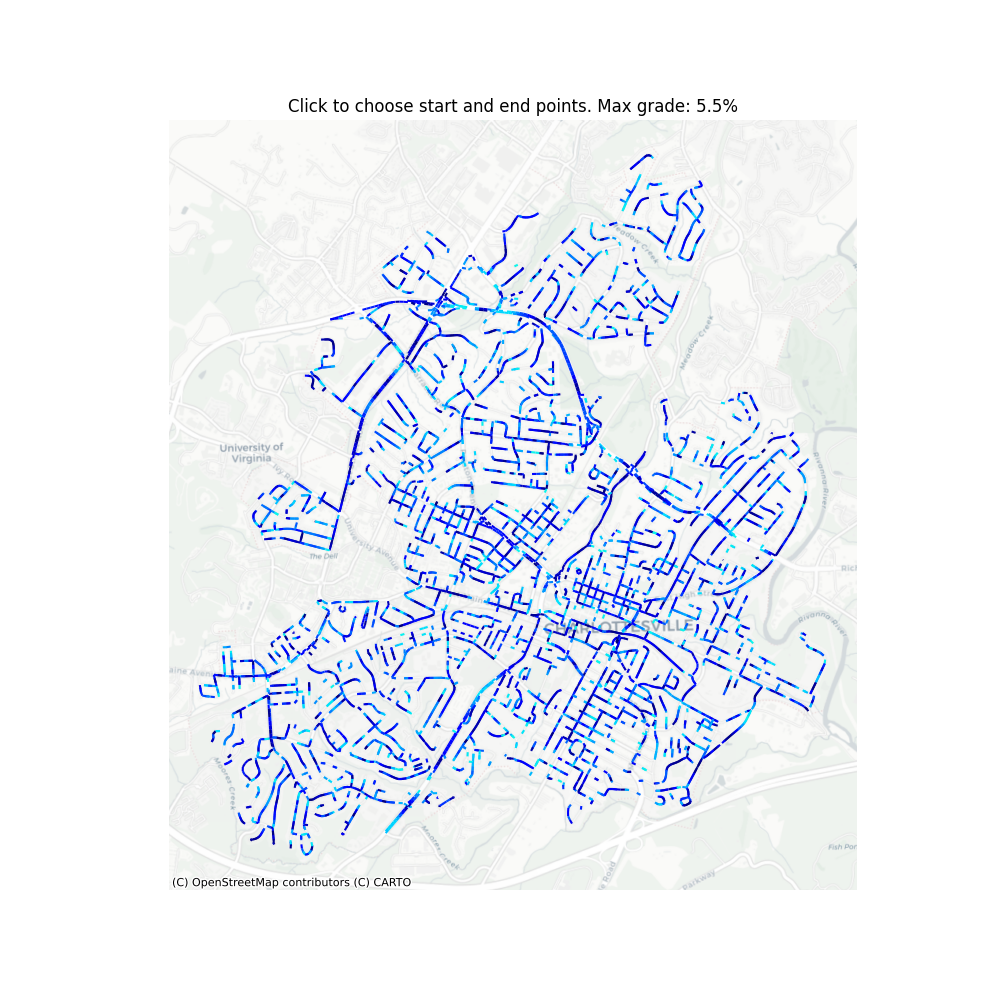

In [31]:
fig, ax = plt.subplots(figsize=(10, 10))
start_pt, end_pt = None, None
path_gdf = None
message_output = widgets.Output()
search_button = widgets.Button(description="Search for Path", button_style="primary", disabled=True)

def build_graph(filtered_gdf):
    G = nx.Graph()
    for _, row in filtered_gdf.iterrows():
        line = row.geometry
        start = tuple(np.round(line.coords[0], 3))
        end = tuple(np.round(line.coords[-1], 3))
        if start == end:
            continue  # skip zero-length segments
        G.add_edge(start, end, weight=line.length, geometry=line, grade=row["abs_grade_percent"])
    return G

    
def on_click(event):
    global start_pt, end_pt
    if event.inaxes != ax:
        return

    clicked = Point(event.xdata, event.ydata)

    if start_pt is None:
        start_pt = clicked
        ax.plot(start_pt.x, start_pt.y, 'go', markersize=10)
        fig.canvas.draw()
    elif end_pt is None:
        end_pt = clicked
        ax.plot(end_pt.x, end_pt.y, 'ro', markersize=10)
        fig.canvas.draw()
        search_button.disabled = False  # Enable search button
def route_and_plot(button=None):
    global start_pt, end_pt, path_gdf
    with message_output:
        clear_output()
        print("🔍 Searching for path...")

    max_grade = grade_slider.value
    filtered = gdf[
        (gdf["abs_grade_percent"] <= max_grade) &
        (gdf["abs_grade_percent"].notna())
    ]

    G = build_graph(filtered)
    node_coords = np.array(list(G.nodes))
    node_tree = cKDTree(node_coords)
    
    try:
        a = snap_to_graph_node(start_pt, node_tree, node_coords)
        b = snap_to_graph_node(end_pt, node_tree, node_coords)
        path_nodes = nx.shortest_path(G, a, b, weight='weight')
    except Exception as e:
        with message_output:
            clear_output()
            print("❌ No path found within grade limit.")
        return


    lines = [G.get_edge_data(path_nodes[i], path_nodes[i+1])['geometry']
             for i in range(len(path_nodes)-1)]
    path_gdf = gpd.GeoDataFrame(geometry=lines, crs=gdf.crs)

    # Replot
    ax.clear()

    filtered.plot(ax=ax, color='lightgray', linewidth=0.5)
    path_gdf.plot(ax=ax, color='red', linewidth=3)
    ax.plot(start_pt.x, start_pt.y, 'go', markersize=10)
    ax.plot(end_pt.x, end_pt.y, 'ro', markersize=10)
    cx.add_basemap(ax, source=cx.providers.CartoDB.Positron, crs=gdf.crs)
    ax.set_title(f"Shortest Path (≤ {max_grade}% Grade)")
    ax.axis("off")
    fig.canvas.draw()

    with message_output:
        clear_output()
        total_length = path_gdf.length.sum()
        print(f"✅ Path found! Total length: {total_length:.1f} meters")

reset_button = widgets.Button(description="Reset Start/End", button_style="warning")

def reset_points(button=None):
    global start_pt, end_pt, path_gdf
    start_pt = None
    end_pt = None
    path_gdf = None
    search_button.disabled = True
    with message_output:
        clear_output()
        print("🔄 Click two points to define a new path.")
    draw_filtered_network()


# --- Connect click handler ---
cid = fig.canvas.mpl_connect('button_press_event', on_click)

# Initial plot
def draw_filtered_network(change=None):
    global start_pt, end_pt, path_gdf
    start_pt, end_pt, path_gdf = None, None, None
    ax.clear()
    filtered = gdf[
        (gdf["abs_grade_percent"] <= grade_slider.value) &
        (gdf["abs_grade_percent"].notna())
    ]
    # filtered.plot(ax=ax, color='lightgray', linewidth=0.5)
    filtered.plot(
            column="abs_grade_percent",
            cmap="jet",
            linewidth=1.5,
            ax=ax,
            legend=False,
            vmin=0, vmax=15  # keep colormap scale fixed
        )
    cx.add_basemap(ax, source=cx.providers.CartoDB.Positron, crs=gdf.crs)
    ax.set_title(f"Click to choose start and end points. Max grade: {round(grade_slider.value,3)}%")
    ax.axis("off")
    fig.canvas.draw()

# Replot when slider changes
search_button.on_click(route_and_plot)
display(grade_slider)

reset_button.on_click(reset_points)
display(widgets.HBox([search_button, reset_button]), message_output)
grade_slider.observe(draw_filtered_network, names='value')

draw_filtered_network()
